In [1]:
%load_ext autoreload
%autoreload 2

# Readme
Change dataset, crop_id, obj_id only

# 1. Crop images

In [2]:
# load sam
from src.model.sam import CustomSamAutomaticMaskGenerator, load_sam
from segment_anything.modeling.sam import Sam
model_type = "vit_h"
checkpoint_dir =  "datasets/bop23_challenge/pretrained/segment-anything"
sam_model = load_sam(model_type, checkpoint_dir)
custom_sam_model = CustomSamAutomaticMaskGenerator(sam=sam_model) #, crop_overlap_ratio = 750 / 1500) # , box_nms_thresh = 0.6 )

In [3]:
def move_to_device(segmentor_model, device="cuda"):
    # if there is predictor in the model, move it to device
    if hasattr(segmentor_model, "predictor"):
        segmentor_model.predictor.model = (
            segmentor_model.predictor.model.to(device)
        )
    else:
        segmentor_model.model.setup_model(device=device, verbose=True)
move_to_device(custom_sam_model)

In [4]:
from PIL import Image
import torch
import numpy as np
from src.model.utils import Detections

dataset = "icbin"
rgb_path = "cnos_analysis/crop_proposals/000001.png" # f"datasets/bop23_challenge/datasets/{dataset}/test/000048/rgb/000001.png"
rgb = Image.open(rgb_path).convert("RGB")
sam_detections = custom_sam_model.generate_masks(np.array(rgb))

In [5]:
def extract_object_by_mask(image, mask, width: int = 512):
    mask = Image.fromarray(mask)
    masked_image = Image.composite(
        image, Image.new("RGB", image.size, (0, 0, 0)), mask)
    cropped_image = masked_image.crop(masked_image.getbbox())
    # new_height = width * cropped_image.height // cropped_image.width
    return cropped_image

masked_images = []
for mask in sam_detections["masks"].cpu():
    binary_mask = np.array(mask) * 255
    binary_mask = binary_mask.astype(np.uint8)
    masked_image = extract_object_by_mask(rgb, binary_mask)
    masked_images.append(masked_image)

In [6]:
# # Visualize proposals
# import matplotlib.pyplot as plt
# from math import ceil
# def plot_images(images, rows, cols):
#     fig, axes = plt.subplots(rows, cols, figsize=(20, 30))
#     for i, ax in enumerate(axes.flat):
#         if i >= len(images):
#             break
#         ax.imshow(images[i])
#         ax.axis('off')
#     plt.tight_layout()
#     plt.show()

# # Define the number of rows and columns in the grid
# rows = ceil(len(masked_images) / 6)
# cols = 6
# # Plot the masked_images array in a grid
# plot_images(masked_images, rows, cols) 

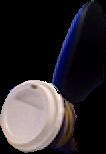

In [7]:
import os

# Choose crop 4 it is in object id 12
crop_idx = 131 # 125, 102 for background; 131 for foreground
obj_id = 1
crop1 = {
    "crop" : masked_images[crop_idx], # it is saved as Image so crop1["crop"] to visualize it
    "masks" : sam_detections["masks"][crop_idx],
    "boxes" : sam_detections["boxes"][crop_idx]
}

# Save image
if not os.path.exists(f"foundpose_analysis/{dataset}"):
    os.makedirs(f"foundpose_analysis/{dataset}")
crop1["crop"].save(f"foundpose_analysis/{dataset}/crop1.png")
crop1["crop"]

# 2. Templates

## 2.1 Create templates of object

In [8]:
# load config file
import hydra
from omegaconf import DictConfig, OmegaConf
from hydra import initialize, compose

# Initialize Hydra and compose the configuration
initialize(config_path="configs")
cfg = compose(config_name="run_inference")
OmegaConf.set_struct(cfg, False)

/tmp/ipykernel_286981/531409554.py:7: UserWarning: 
The version_base parameter is not specified.
Please specify a compatability version level, or None.
Will assume defaults for version 1.1
  initialize(config_path="configs")


In [9]:
import os
import glob

default_ref_dataloader_config = cfg.data.reference_dataloader
ref_dataloader_config = default_ref_dataloader_config.copy()
ref_dataloader_config._target_ = "src.dataloader.bop_pbr.BOPTemplatePBR"
ref_dataloader_config.root_dir = f"datasets/bop23_challenge/datasets/{dataset}"
ref_dataloader_config.template_dir = " "

level_template = 1 # Level 0 :42 templates, level 1, 162 templates
ref_dataloader_config.level_templates = level_template 
ref_dataloader_config.split = "train_pbr" # train_pbr

ply_files = glob.glob(f"datasets/bop23_challenge/datasets/{dataset}/models/models/*.ply")
obj_ids = sorted([int(os.path.basename(obj_id)[8:10]) for obj_id in ply_files])
ref_dataloader_config.obj_ids = obj_ids

out_folder = f"foundpose_analysis/{dataset}/templates"
if not os.path.exists(out_folder):
    os.makedirs(out_folder)
ref_dataloader_config.out_dir = out_folder
ref_dataloader_config.templates_output_folder = f"{out_folder}/level_template_{level_template}"

In [10]:
import os
os.environ['HYDRA_FULL_ERROR'] = '1'

In [11]:
# # Error : must delete all metadata.csv 
# # If using test it can happen that the object id doesnt appear in the test folder- so can get empty list - just use try except la ok
# from hydra.utils import instantiate
# ref_dataset = instantiate(ref_dataloader_config) # src.dataloader.bop.BOPTemplatePBR
# ref_dataset.load_processed_metaData(reset_metaData=True)

In [12]:
# from torchvision.utils import save_image
# import pandas as pd

# templates = pd.read_csv(f"{out_folder}/{ref_dataloader_config.split}_processed_metaData.csv")

# # Save templates as images
# for ob_id in range(len(obj_ids)): 
#     obj_id_path = os.path.join(f"{out_folder}/{ref_dataloader_config.split}_images_templates", f'obj_{(ob_id+1):06d}') # The transformed templates - check line 244, 245 in bop_pbr.py
#     original_obj_id_path = os.path.join(f"{out_folder}/{ref_dataloader_config.split}_images_templates", f'obj_{(ob_id+1):06d}_original')
    
#     if not os.path.exists(obj_id_path):
#         os.makedirs(obj_id_path)
#     if not os.path.exists(original_obj_id_path):
#         os.makedirs(original_obj_id_path)

#     try:  
#         for i, img in enumerate(ref_dataset[ob_id]["templates"]): # all the crop her is normalize and resize to 224*224 alsready in __getitem__
#             save_image(img, os.path.join(obj_id_path, f'{i:06d}.png'))
#         for i, img in enumerate(ref_dataset[ob_id]["original_templates"]): # all the crop her is normalize and resize to 224*224 alsready in __getitem__
#             save_image(img, os.path.join(original_obj_id_path, f'{i:06d}.png'))
#     except Exception as e:
#         print(f"An error occurred: {e}")

## 2.2. Templates features extraction

In [146]:
import glob
import os

obj_id_2 = 2
real_data_type = "test" # test

# Load original templates when before putting through dinov2 we also apply transfomation.
real_template_path_1 = f"{out_folder}/{real_data_type}_images_templates/obj_{obj_id:06d}_original" 
real_template_path_2 = f"{out_folder}/{real_data_type}_images_templates/obj_{obj_id_2:06d}_original" 
real_template_files_1 = sorted(glob.glob(os.path.join(real_template_path_1, "*.png")), key=os.path.getmtime)
real_template_files_2 = sorted(glob.glob(os.path.join(real_template_path_2, "*.png")), key=os.path.getmtime)
real_template_files = real_template_files_1 + real_template_files_2
real_num_templates = len(real_template_files)
real_num_templates

324

In [147]:
import glob
import os

obj_id_2 = 2
syn_data_type = "train_pbr" # test

# Load original templates when before putting through dinov2 we also apply transformation.
syn_template_path_1 = f"{out_folder}/{syn_data_type}_images_templates/obj_{obj_id:06d}_original" 
syn_template_path_2 = f"{out_folder}/{syn_data_type}_images_templates/obj_{obj_id_2:06d}_original" 
syn_template_files_1 = sorted(glob.glob(os.path.join(syn_template_path_1, "*.png")), key=os.path.getmtime)
syn_template_files_2 = sorted(glob.glob(os.path.join(syn_template_path_2, "*.png")), key=os.path.getmtime)
syn_template_files = syn_template_files_1 + syn_template_files_2
syn_num_templates = len(syn_template_files)
syn_num_templates

324

In [148]:
import glob
import os

obj_id_2 = 2

# Load original templates when before putting through dinov2 we also apply transformation.
pyrender_template_path_1 = f"datasets/bop23_challenge/datasets/templates_pyrender/icbin/obj_{obj_id:06d}" 
pyrender_template_path_2 = f"datasets/bop23_challenge/datasets/templates_pyrender/icbin/obj_{obj_id_2:06d}" 
pyrender_template_files_1 = sorted(glob.glob(os.path.join(pyrender_template_path_1, "*.png")), key=os.path.getmtime)
pyrender_template_files_2 = sorted(glob.glob(os.path.join(pyrender_template_path_2, "*.png")), key=os.path.getmtime)
pyrender_template_files = pyrender_template_files_1 + pyrender_template_files_2
pyrender_num_templates = len(pyrender_template_files)
pyrender_num_templates

1284

In [149]:
from PIL import Image
import numpy as np
# [50:450, 150:500, :3] only for pyrender template not for BlenderProc templates
real_templates = [np.array(Image.open(template_file).convert("RGB"))[:,:,:3] for template_file in real_template_files] # This image has 4 channels- the last one is not crucial - maybe about opacity
syn_templates = [np.array(Image.open(template_file).convert("RGB"))[:,:,:3] for template_file in syn_template_files] # This image has 4 channels- the last one is not crucial - maybe about opacity
pyrender_templates = [np.array(Image.open(template_file).convert("RGB"))[50:450, 150:500, :3] for template_file in pyrender_template_files]

In [150]:
def _create_mask(image, threshold=10):
    return (np.sum(np.array(image), axis=2) > threshold).astype(np.uint8)

mask_real_templates = [_create_mask(real_temp) for real_temp in real_templates] # This image has 4 channels- the last one is not crucial - maybe about opacity
mask_syn_templates = [_create_mask(syn_temp) for syn_temp in syn_templates] # This image has 4 channels- the last one is not crucial - maybe about opacity
mask_pyrender_templates = [_create_mask(py_temp) for py_temp in pyrender_templates]

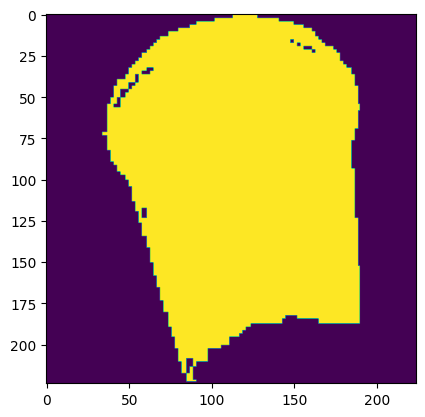

In [151]:
plt.imshow(mask_real_templates[0])
## See lb 

In [152]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
dinov2_vitl14 = torch.hub.load('facebookresearch/dinov2', 'dinov2_vitl14')
dinov2_vitl14.patch_size = 14
if torch.cuda.is_available():
    dinov2_vitl14 = torch.nn.DataParallel(dinov2_vitl14).to(device)  # Use DataParallel for multiple GPUs

Using cache found in /home/cuong.vandam/.cache/torch/hub/facebookresearch_dinov2_main


normalized_templates shape torch.Size([3, 224, 224])
scaled_padded_templates.shape 324 torch.Size([3, 420, 420])


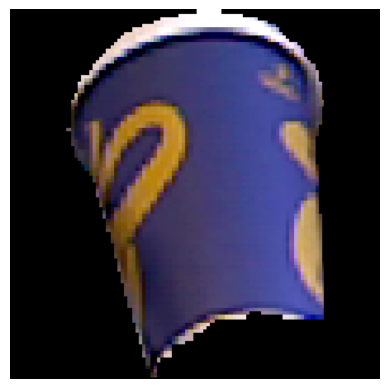

normalized_templates shape torch.Size([3, 224, 224])
scaled_padded_templates.shape 324 torch.Size([3, 420, 420])


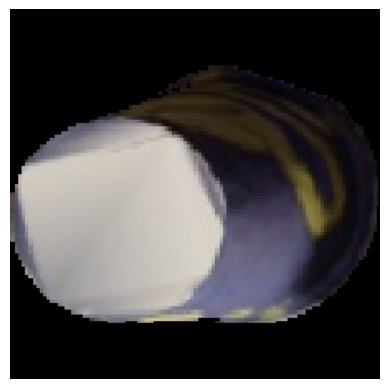

normalized_templates shape torch.Size([3, 400, 350])
scaled_padded_templates.shape 1284 torch.Size([3, 420, 420])


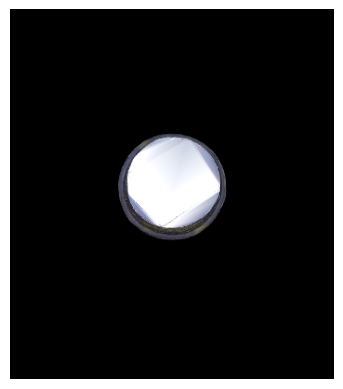

In [153]:
from src.model.foundpose import (
    crop_feature_extraction, 
    kmeans_clustering, 
    calculate_templates_labels, 
    calculate_templates_vector,
    calculate_crop_vector,
    calculate_similarity,
    templates_feature_extraction,
    templates_feature_extraction_3
)


real_num_valid_patches, real_valid_patch_features = templates_feature_extraction_3(
    templates = real_templates,
    template_masks = mask_real_templates,
    num_templates = real_num_templates, 
    dino_model = dinov2_vitl14, 
    device = device
    )
syn_num_valid_patches, syn_valid_patch_features = templates_feature_extraction_3(
    templates = syn_templates, 
    template_masks = mask_syn_templates, 
    num_templates = syn_num_templates, 
    dino_model = dinov2_vitl14, 
    device = device
)
pyrender_num_valid_patches, pyrender_valid_patch_features = templates_feature_extraction_3(
    templates = pyrender_templates, 
    template_masks = mask_pyrender_templates, 
    num_templates = pyrender_num_templates, 
    dino_model = dinov2_vitl14, 
    device = device
)

# 3. Template macthing with Foundpose

In [154]:
from sklearn.decomposition import PCA
from src.model.foundpose import calculate_similarity, crop_feature_extraction_3

def bow_retrieval(crop_rgb, templates, valid_patch_features, num_valid_patches, dino_model = dinov2_vitl14, device = device):
    crop_num_valid_patches, valid_crop_feature_patches = crop_feature_extraction_3(crop_rgb = crop_rgb, dino_model = dinov2_vitl14, device = device)
    all_valid_patch_features = torch.cat((valid_crop_feature_patches.to('cpu'), valid_patch_features), dim=0)
    # PCA
    pca = PCA(n_components=256, random_state=5)
    pca_crop_patches_descriptors = pca.fit_transform(np.array(all_valid_patch_features.cpu()))
    
    pca_crop = pca_crop_patches_descriptors[:valid_crop_feature_patches.shape[0]]
    pca_templates = pca_crop_patches_descriptors[valid_crop_feature_patches.shape[0]:]

    kmeans = kmeans_clustering(pca_templates, ncentroids = 2048, niter = 20, verbose = True)
    templates_labels = calculate_templates_labels(num_valid_patches, kmeans, pca_templates)
    templates_vector = calculate_templates_vector(templates_labels = templates_labels, num_clusters = 2048)

    # Assign labels to the data points
    crop_labels = kmeans.index.search(pca_crop, 1)[1].reshape(-1)
    
    crop_vector = calculate_crop_vector(crop_labels = crop_labels, templates_labels = templates_labels, num_clusters = 2048)
    concat_templates_vector = torch.cat([torch.tensor(vector).view(1,-1) for vector in templates_vector]) # Goal torch.Size([642, 2048])

    # Compare crop to templates
    calculate_similarity(crop_rgb, crop_vector, concat_templates_vector, templates, synthetic=True)
    return 0

## 3.1 Normal crop

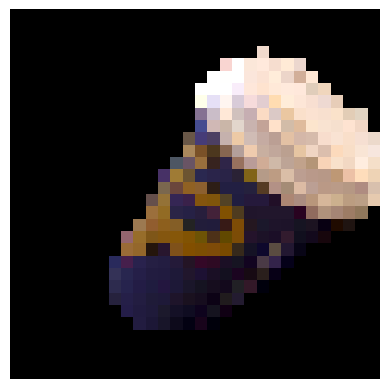

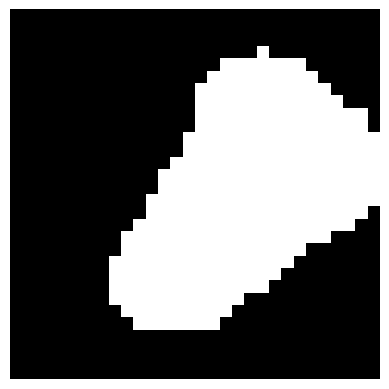

Clustering 132414 points in 256D to 2048 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.01 s
  Iteration 19 (0.47 s, search 0.36 s): objective=1.48291e+08 imbalance=1.145 nsplit=0       


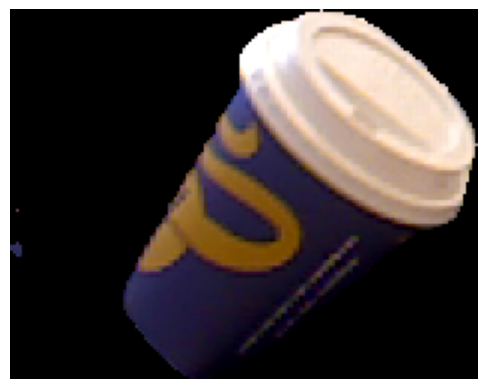

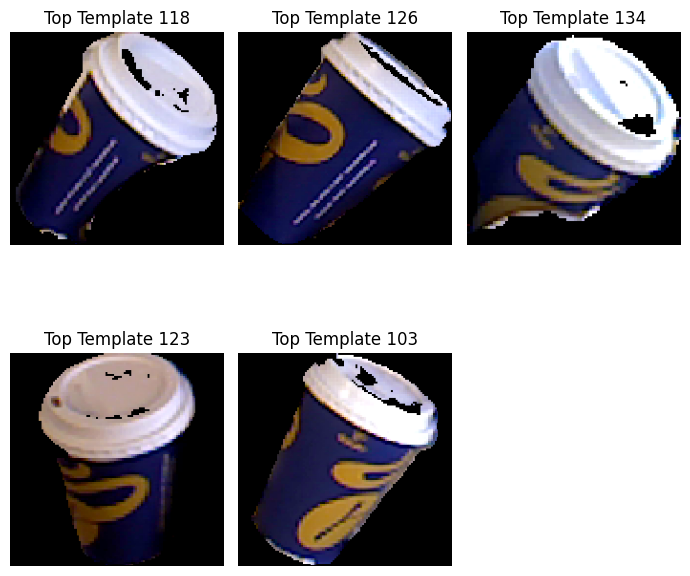

Top 5 scores: [0.529, 0.373, 0.372, 0.345, 0.317]
Average score: 0.387


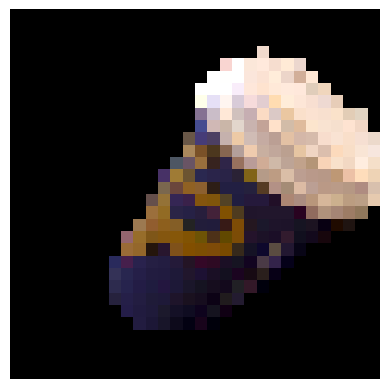

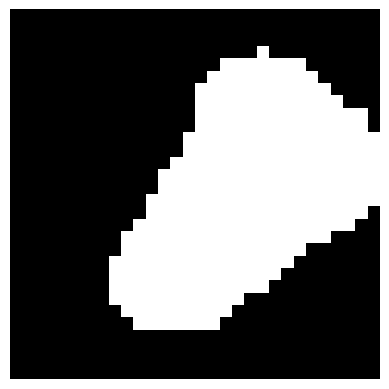

Clustering 139386 points in 256D to 2048 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.01 s
  Iteration 19 (0.49 s, search 0.38 s): objective=1.98301e+08 imbalance=1.094 nsplit=0       


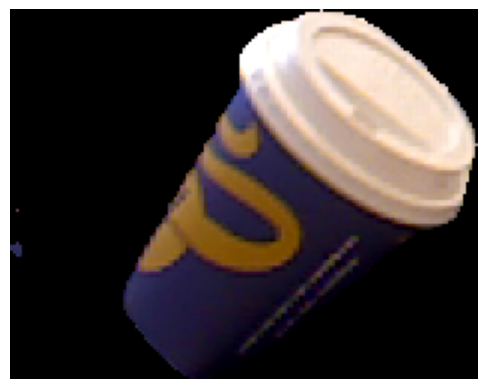

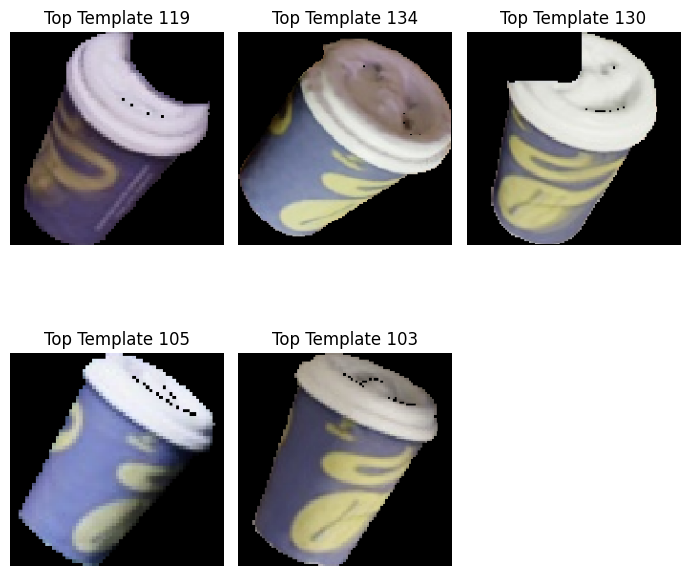

Top 5 scores: [0.361, 0.333, 0.317, 0.237, 0.231]
Average score: 0.296


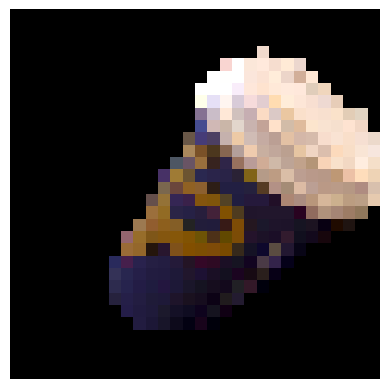

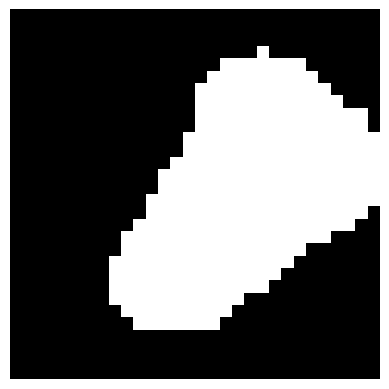

Clustering 187482 points in 256D to 2048 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.01 s
  Iteration 19 (0.66 s, search 0.52 s): objective=1.5968e+08 imbalance=1.086 nsplit=0        


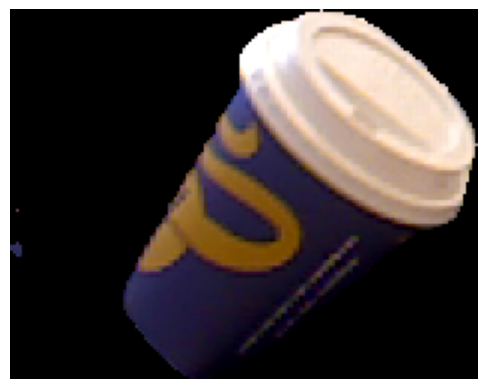

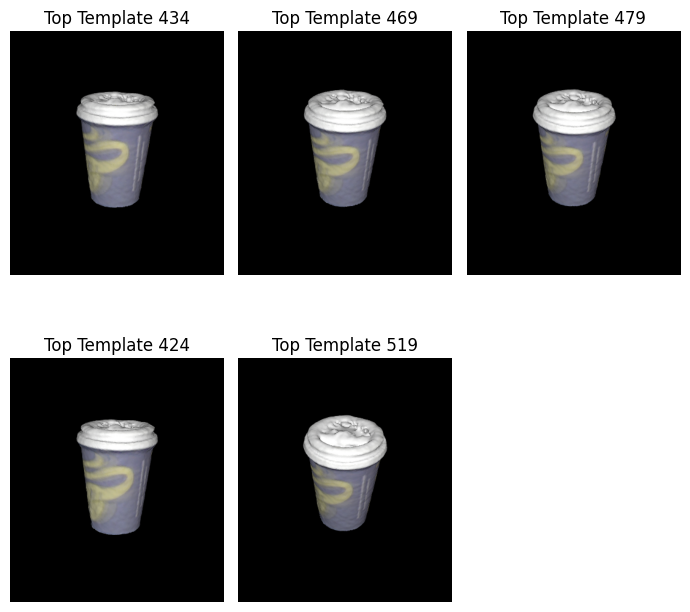

Top 5 scores: [0.293, 0.292, 0.283, 0.274, 0.26]
Average score: 0.28


0

In [155]:
crop_rgb = np.array(Image.open("cnos_analysis/crop_proposals/crop1.png").convert("RGB")) # (124, 157, 3)
bow_retrieval(crop_rgb, real_templates, real_valid_patch_features, real_num_valid_patches)
bow_retrieval(crop_rgb, syn_templates, syn_valid_patch_features, syn_num_valid_patches)
bow_retrieval(crop_rgb, pyrender_templates, pyrender_valid_patch_features, pyrender_num_valid_patches)

## 3.2 Zoomed crop

In [156]:
from scipy.ndimage import zoom
def zoom_in(image, scale):
    return zoom(image, (scale, scale, 1))[image.shape[0]:,image.shape[1]:,:]

def zoom_out(image, scale):
    zoomed_out_image =  zoom(image, (1/scale, 1/scale, 1))
    # print(np.min(zoomed_out_image))
    background = np.zeros((image.shape[0], image.shape[1], image.shape[2]))
    background[image.shape[0]//2:zoomed_out_image.shape[0]+image.shape[0]//2, image.shape[0]//2:zoomed_out_image.shape[1]
        +image.shape[0]//2,:] = zoomed_out_image
    # print(np.min(background))
    # Clip values to be in the valid range [0, 255] and convert back to uint8
    background = background.astype("uint8")
    return background

crop_rgb = np.array(Image.open("cnos_analysis/crop_proposals/crop1.png").convert("RGB")) # (124, 157, 3)
zoom_scale = 3  # Zoom in by a factor of 2
crop_rgb_zoomed_in = zoom_in(crop_rgb, zoom_scale)
crop_rgb_zoomed_out = zoom_out(crop_rgb, scale=2)

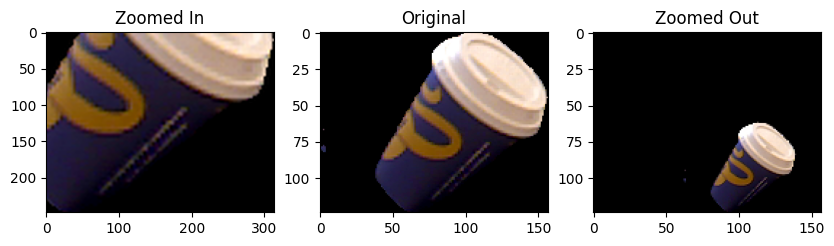

In [157]:
import matplotlib.pyplot as plt
# Display the images
plt.figure(figsize=(10, 5))
plt.subplot(1, 3, 1)
plt.title(f"Zoomed In")
plt.imshow(crop_rgb_zoomed_in)

plt.subplot(1, 3, 2)
plt.title(f"Original")
plt.imshow(crop_rgb)

plt.subplot(1, 3, 3)
plt.title(f"Zoomed Out")
plt.imshow(crop_rgb_zoomed_out)

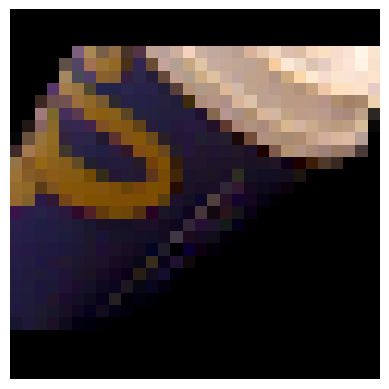

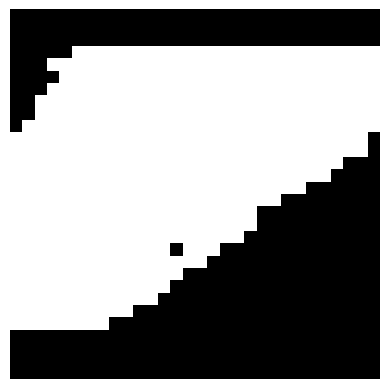

Clustering 132414 points in 256D to 2048 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.01 s
  Iteration 19 (0.46 s, search 0.36 s): objective=1.4835e+08 imbalance=1.145 nsplit=0        


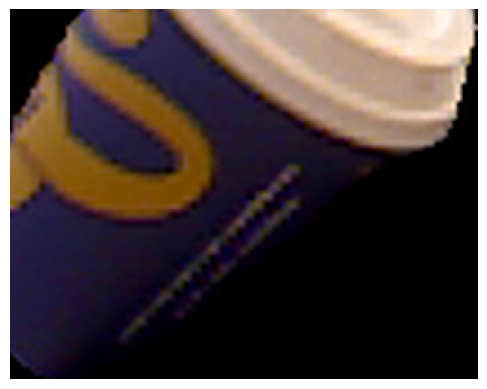

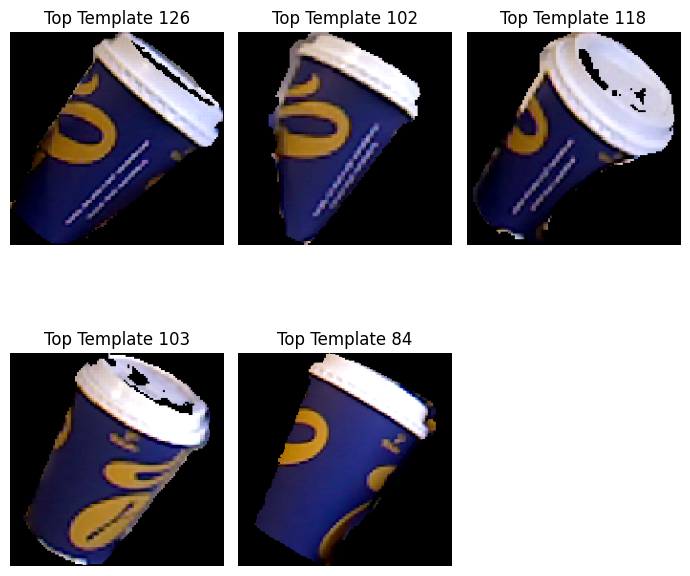

Top 5 scores: [0.612, 0.519, 0.451, 0.346, 0.26]
Average score: 0.438


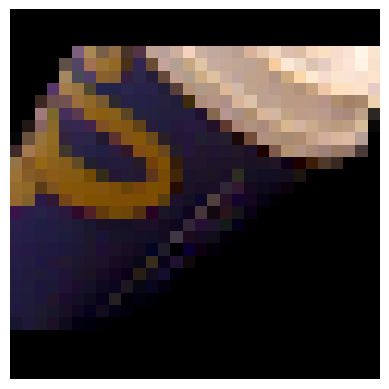

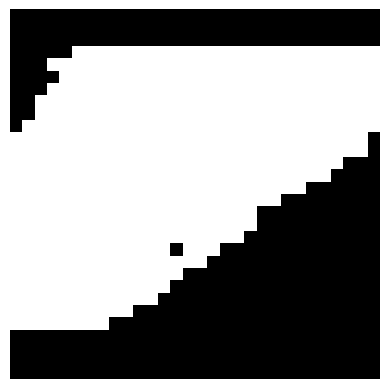

Clustering 139386 points in 256D to 2048 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.01 s
  Iteration 19 (0.51 s, search 0.40 s): objective=1.98285e+08 imbalance=1.094 nsplit=0       


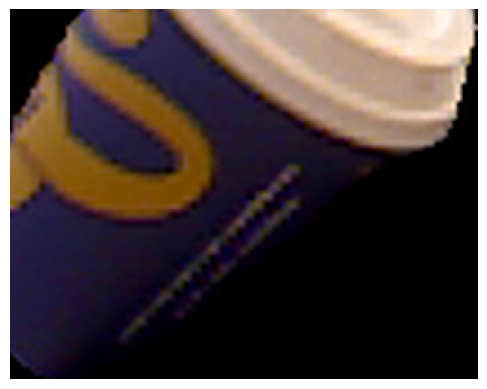

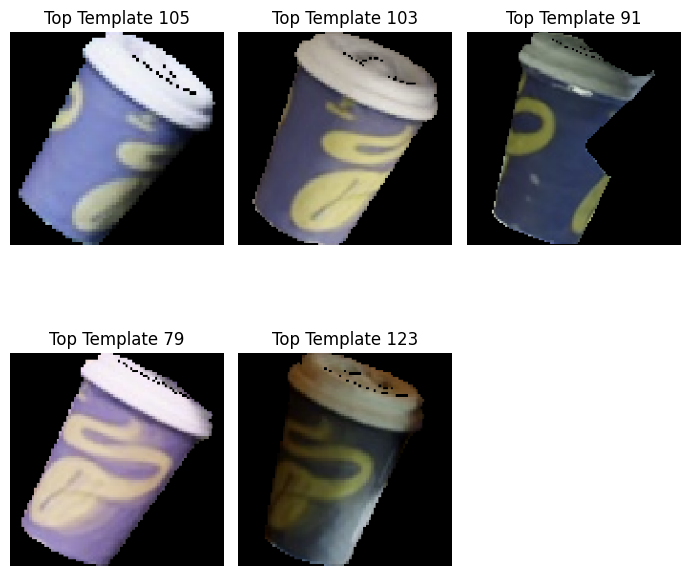

Top 5 scores: [0.449, 0.447, 0.333, 0.297, 0.293]
Average score: 0.364


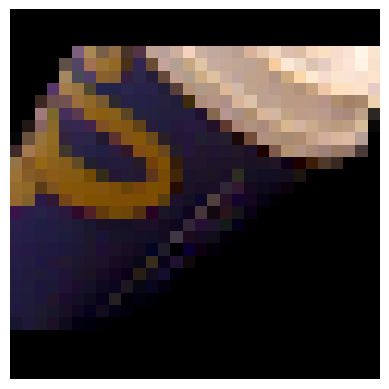

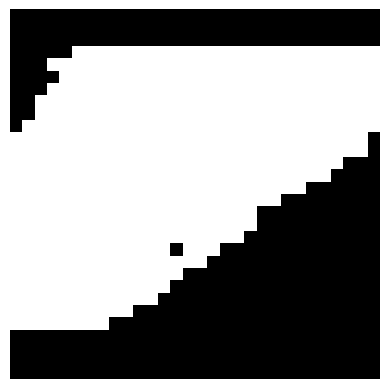

Clustering 187482 points in 256D to 2048 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.01 s
  Iteration 19 (0.69 s, search 0.53 s): objective=1.59649e+08 imbalance=1.086 nsplit=0       


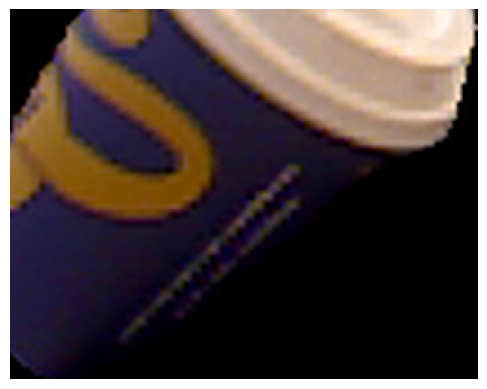

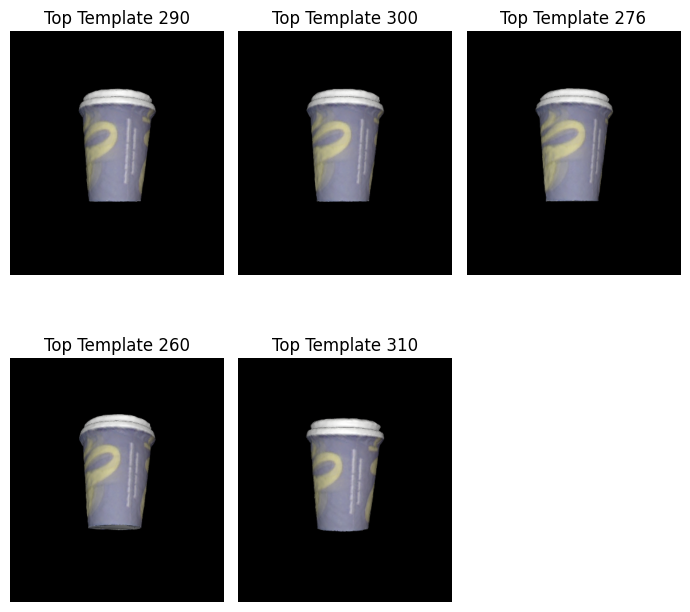

Top 5 scores: [0.257, 0.244, 0.236, 0.234, 0.221]
Average score: 0.238


0

In [158]:
bow_retrieval(crop_rgb_zoomed_in, real_templates, real_valid_patch_features, real_num_valid_patches)
bow_retrieval(crop_rgb_zoomed_in, syn_templates, syn_valid_patch_features, syn_num_valid_patches)
bow_retrieval(crop_rgb_zoomed_in, pyrender_templates, pyrender_valid_patch_features, pyrender_num_valid_patches)

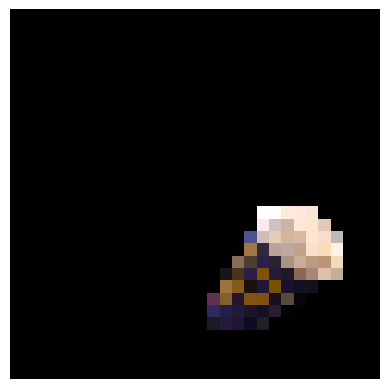

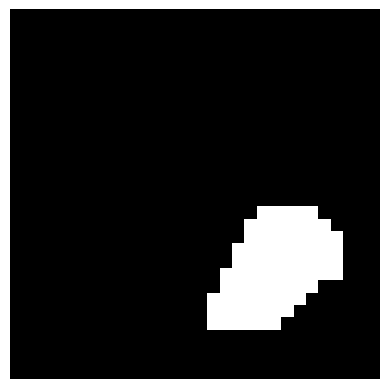

Clustering 132414 points in 256D to 2048 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.01 s
  Iteration 19 (0.48 s, search 0.38 s): objective=1.48392e+08 imbalance=1.144 nsplit=0       


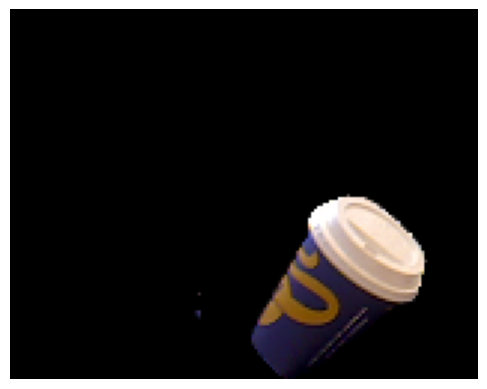

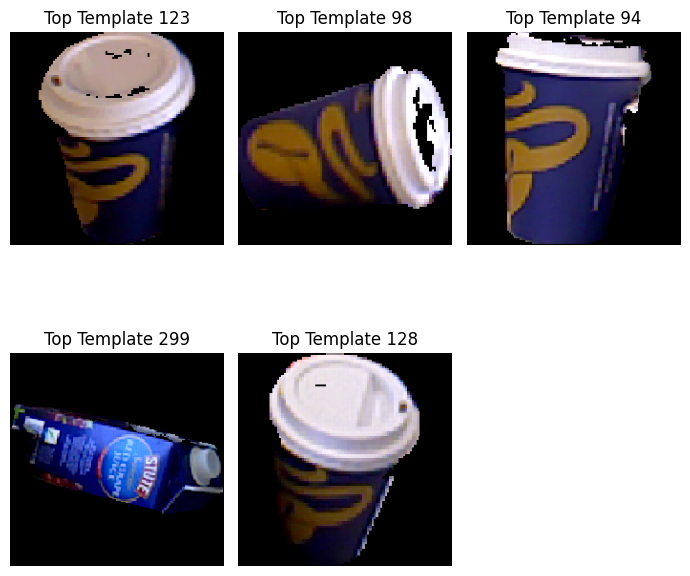

Top 5 scores: [0.227, 0.196, 0.188, 0.172, 0.159]
Average score: 0.188


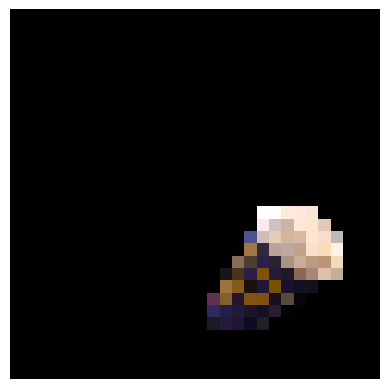

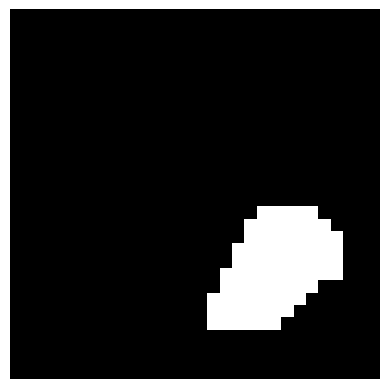

Clustering 139386 points in 256D to 2048 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.01 s
  Iteration 19 (0.49 s, search 0.38 s): objective=1.98311e+08 imbalance=1.097 nsplit=0       


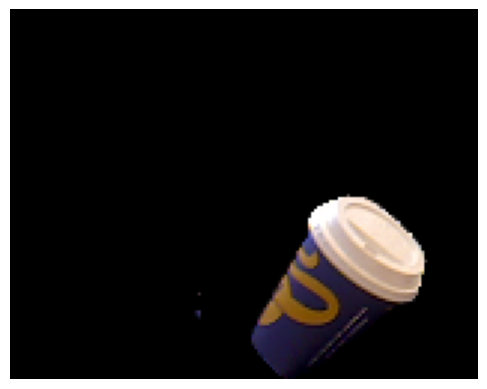

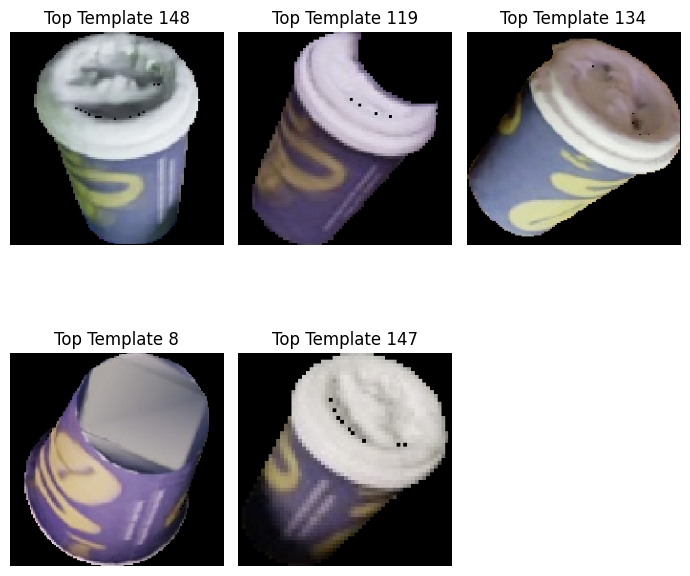

Top 5 scores: [0.263, 0.211, 0.189, 0.182, 0.141]
Average score: 0.197


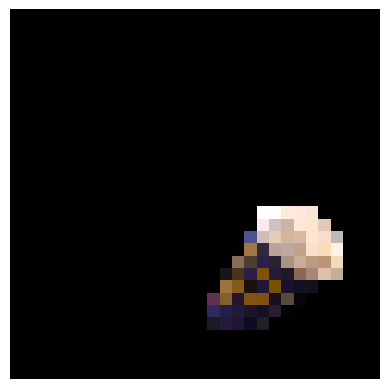

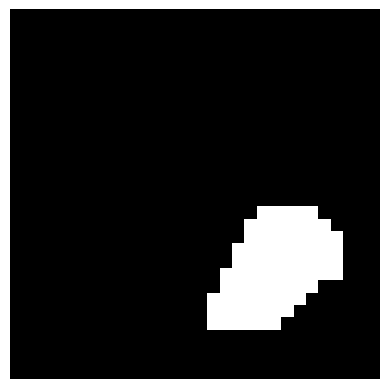

Clustering 187482 points in 256D to 2048 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.01 s
  Iteration 19 (0.68 s, search 0.53 s): objective=1.59659e+08 imbalance=1.086 nsplit=0       


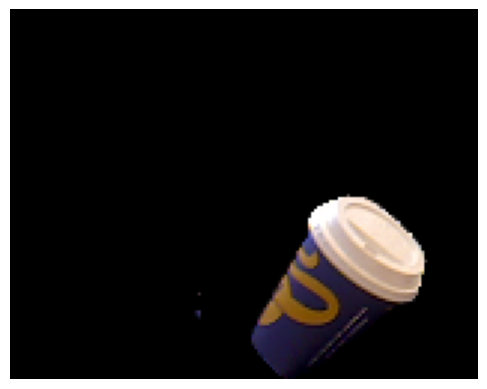

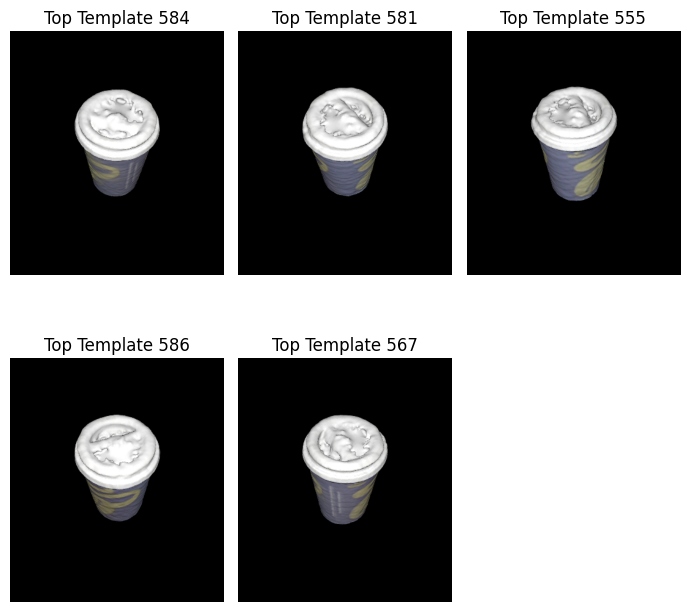

Top 5 scores: [0.246, 0.221, 0.22, 0.219, 0.21]
Average score: 0.223


0

In [159]:
bow_retrieval(crop_rgb_zoomed_out, real_templates, real_valid_patch_features, real_num_valid_patches)
bow_retrieval(crop_rgb_zoomed_out, syn_templates, syn_valid_patch_features, syn_num_valid_patches)
bow_retrieval(crop_rgb_zoomed_out, pyrender_templates, pyrender_valid_patch_features, pyrender_num_valid_patches)

## 3.3 In-plane rotated crop

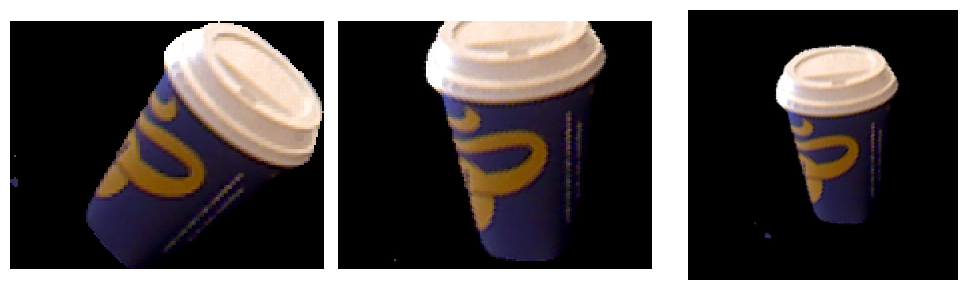

In [160]:
from scipy import ndimage, datasets
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(10, 3))
ax1, ax2, ax3 = fig.subplots(1, 3)
img = crop_rgb
img_45 = ndimage.rotate(img, 45, reshape=False)
full_img_45 = ndimage.rotate(img, 45, reshape=True)
ax1.imshow(img, cmap='gray')
ax1.set_axis_off()
ax2.imshow(img_45, cmap='gray')
ax2.set_axis_off()
ax3.imshow(full_img_45, cmap='gray')
ax3.set_axis_off()
fig.set_layout_engine('tight')
plt.show()

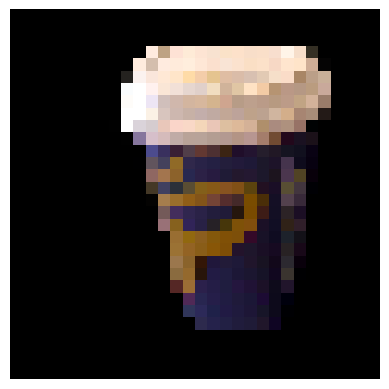

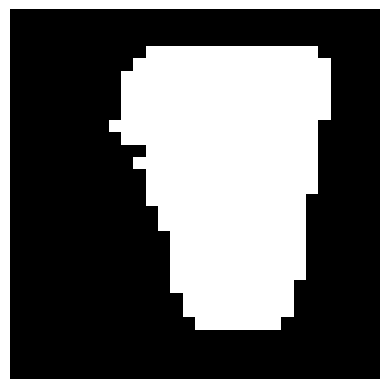

Clustering 132414 points in 256D to 2048 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.01 s
  Iteration 19 (0.47 s, search 0.37 s): objective=1.48408e+08 imbalance=1.144 nsplit=0       


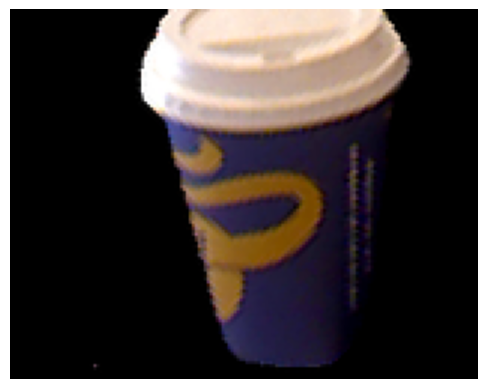

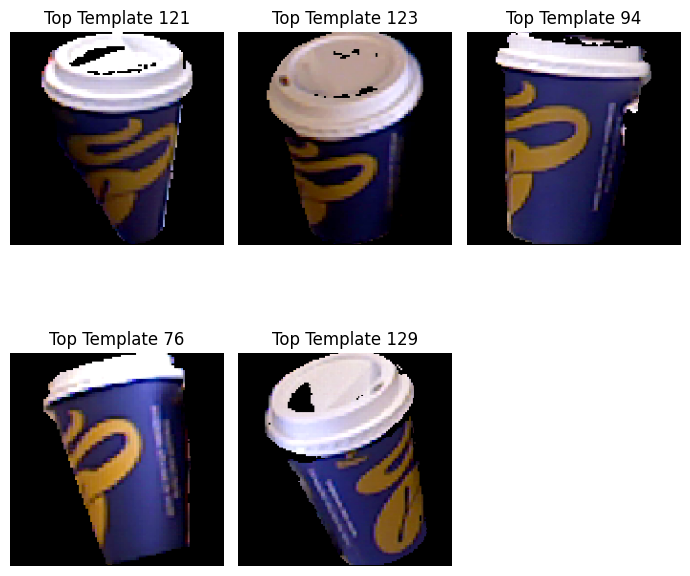

Top 5 scores: [0.465, 0.45, 0.446, 0.435, 0.405]
Average score: 0.44


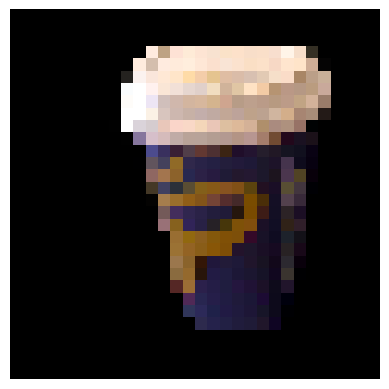

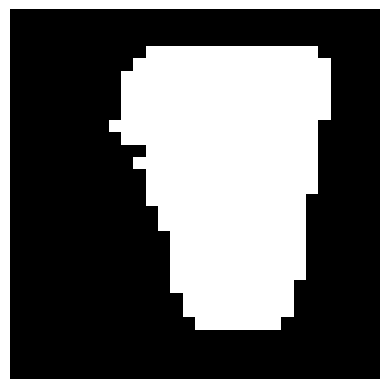

Clustering 139386 points in 256D to 2048 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.01 s
  Iteration 19 (0.50 s, search 0.39 s): objective=1.98305e+08 imbalance=1.094 nsplit=0       


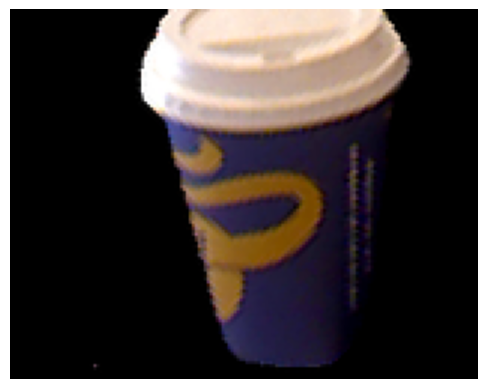

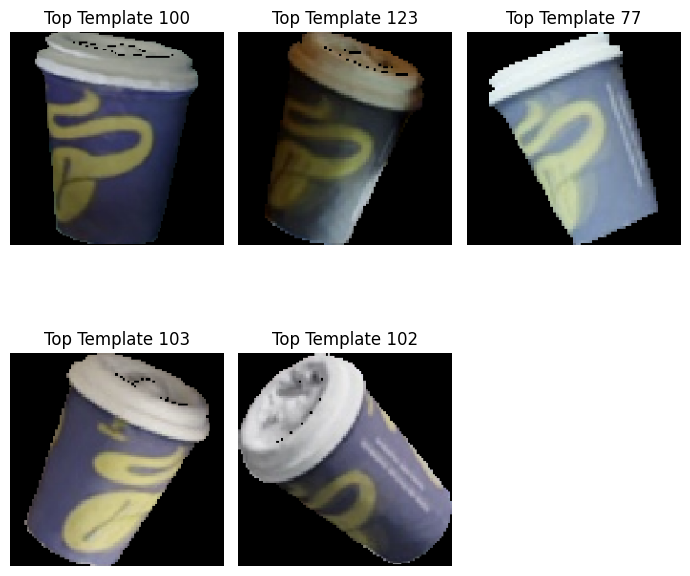

Top 5 scores: [0.514, 0.429, 0.344, 0.318, 0.316]
Average score: 0.384


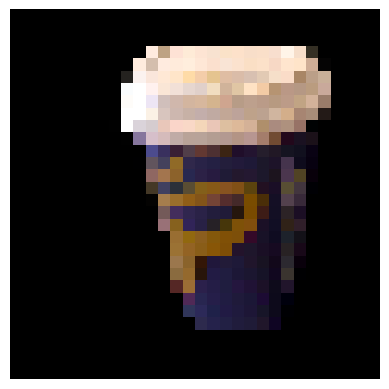

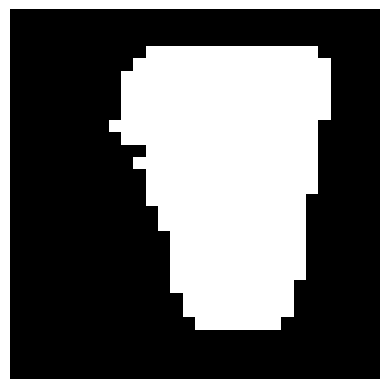

Clustering 187482 points in 256D to 2048 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.01 s
  Iteration 19 (0.73 s, search 0.56 s): objective=1.59696e+08 imbalance=1.086 nsplit=0       


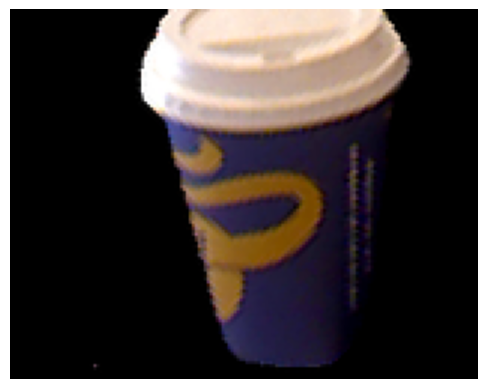

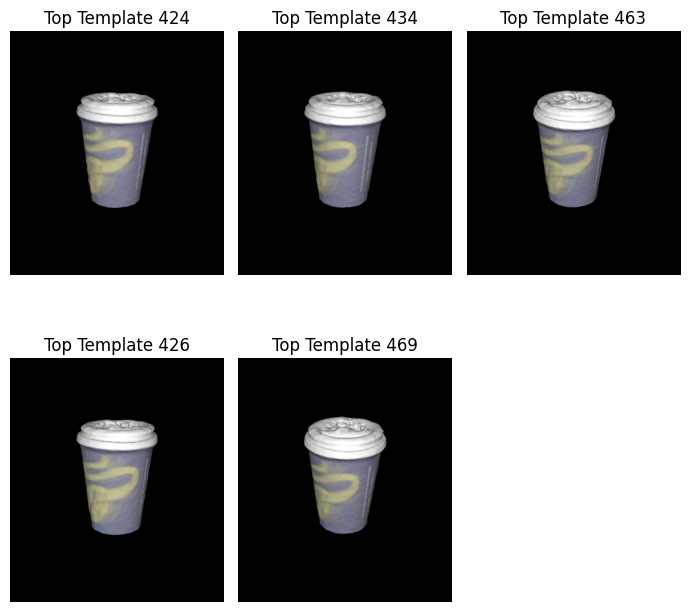

Top 5 scores: [0.431, 0.41, 0.404, 0.397, 0.39]
Average score: 0.406


0

In [161]:
# Rotate 45 
bow_retrieval(img_45, real_templates, real_valid_patch_features, real_num_valid_patches)
bow_retrieval(img_45, syn_templates, syn_valid_patch_features, syn_num_valid_patches)
bow_retrieval(img_45, pyrender_templates, pyrender_valid_patch_features, pyrender_num_valid_patches)

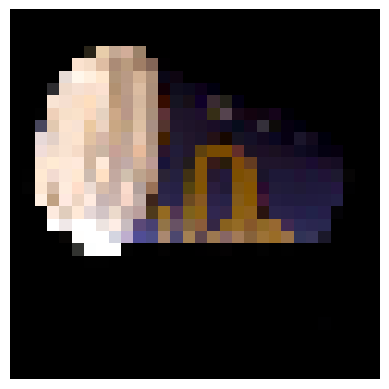

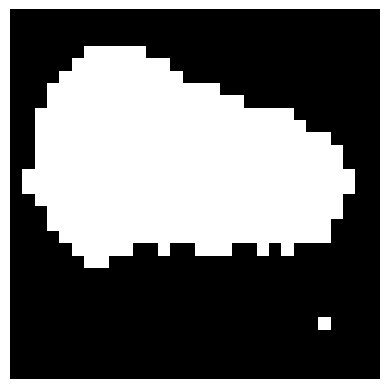

Clustering 132414 points in 256D to 2048 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.01 s
  Iteration 19 (0.46 s, search 0.36 s): objective=1.48274e+08 imbalance=1.143 nsplit=0       


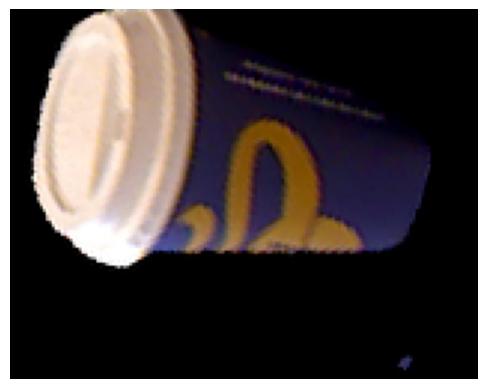

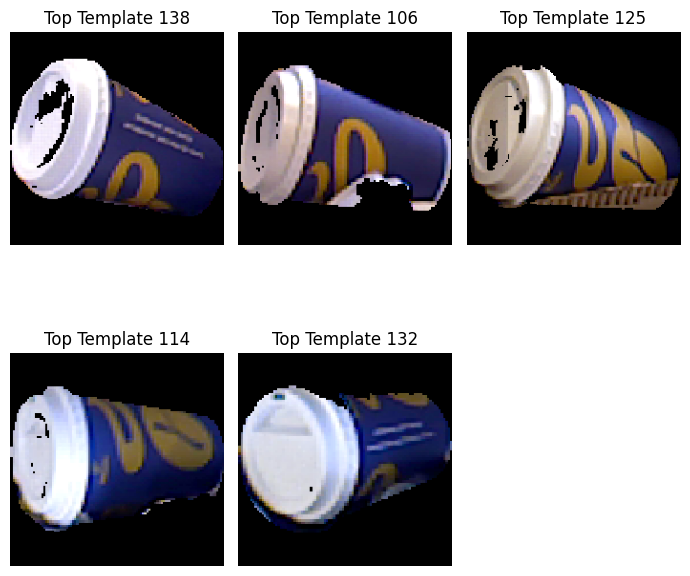

Top 5 scores: [0.555, 0.553, 0.468, 0.456, 0.438]
Average score: 0.494


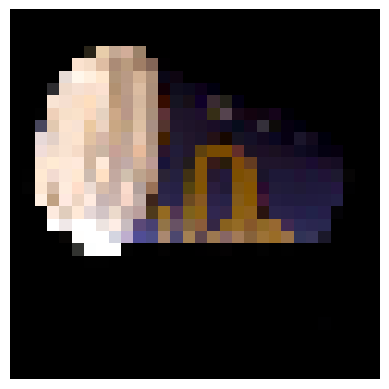

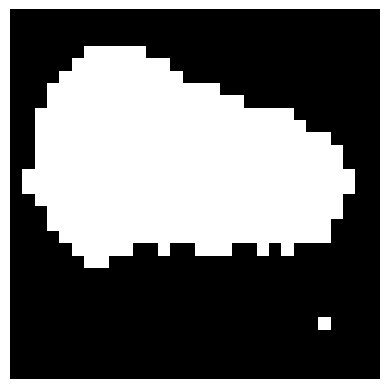

Clustering 139386 points in 256D to 2048 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.01 s
  Iteration 19 (0.48 s, search 0.38 s): objective=1.98246e+08 imbalance=1.095 nsplit=0       


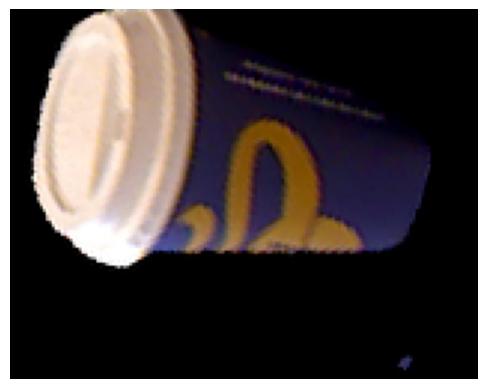

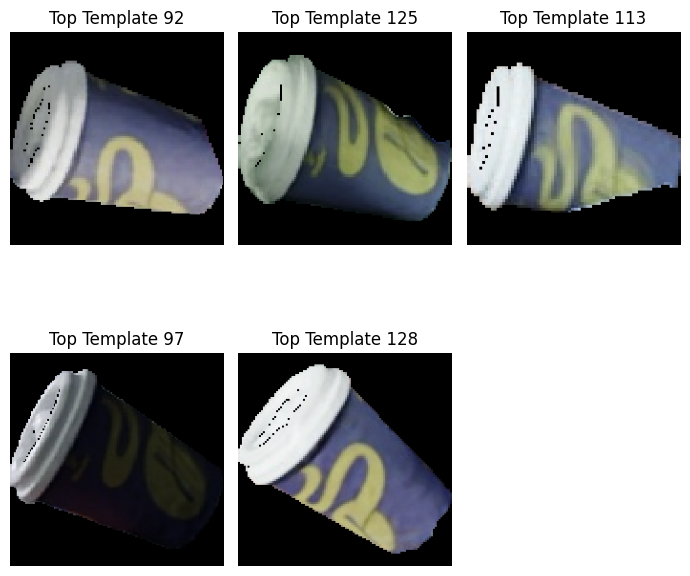

Top 5 scores: [0.579, 0.468, 0.456, 0.378, 0.374]
Average score: 0.451


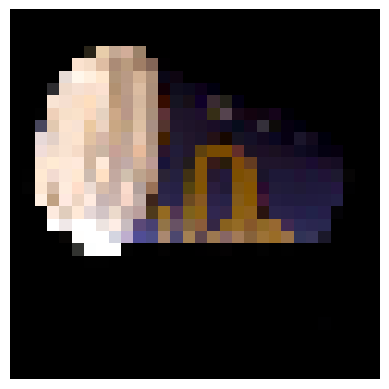

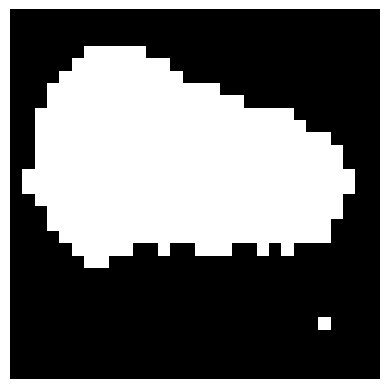

Clustering 187482 points in 256D to 2048 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.01 s
  Iteration 19 (0.65 s, search 0.51 s): objective=1.59674e+08 imbalance=1.086 nsplit=0       


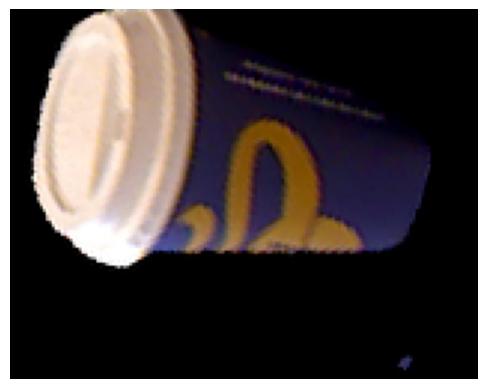

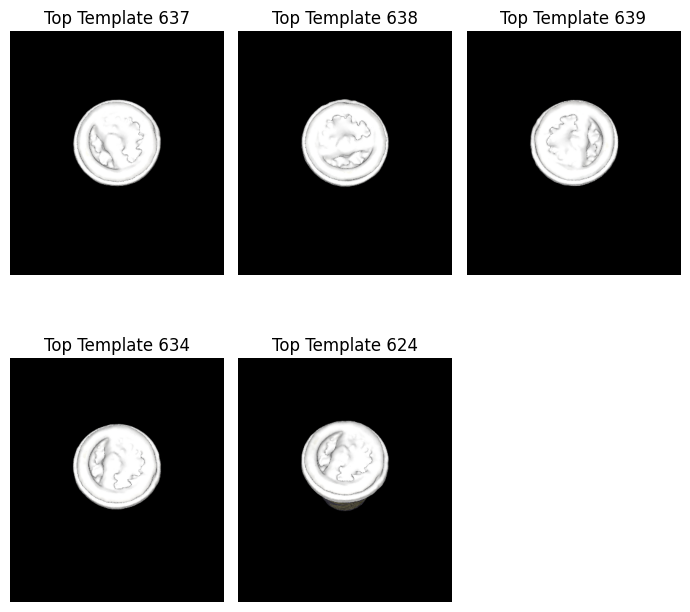

Top 5 scores: [0.167, 0.16, 0.155, 0.134, 0.129]
Average score: 0.149


0

In [162]:
bow_retrieval(img_120, real_templates, real_valid_patch_features, real_num_valid_patches)
bow_retrieval(img_120, syn_templates, syn_valid_patch_features, syn_num_valid_patches)
bow_retrieval(img_120, pyrender_templates, pyrender_valid_patch_features, pyrender_num_valid_patches)

## 3.4 Occluded crop

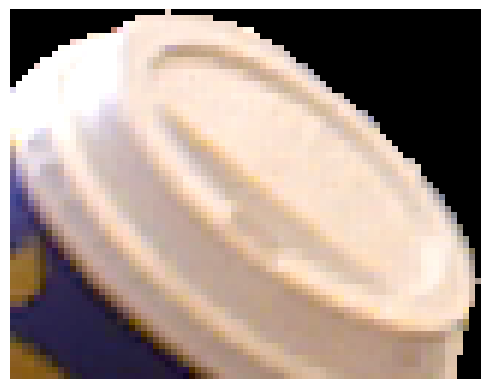

In [163]:
# occluded_crop = crop_rgb[124//2:,:157//2,:]
occluded_crop = crop_rgb[:124//2,157//2:,:]
import matplotlib.pyplot as plt
plt.imshow(occluded_crop)
plt.axis("off")
plt.show()

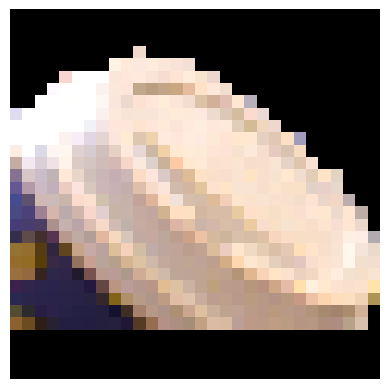

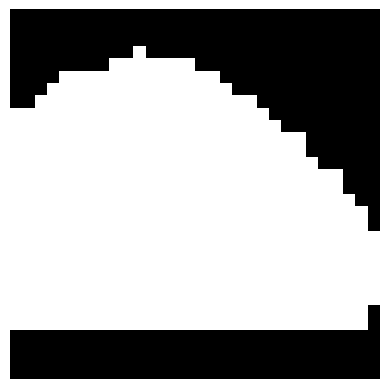

Clustering 132414 points in 256D to 2048 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.01 s
  Iteration 19 (0.46 s, search 0.36 s): objective=1.48361e+08 imbalance=1.143 nsplit=0       


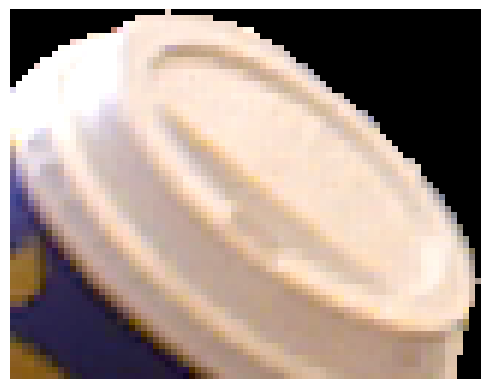

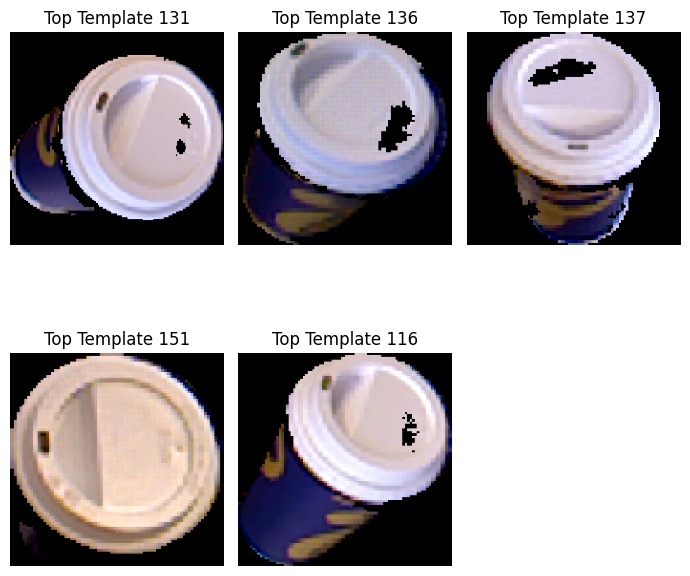

Top 5 scores: [0.406, 0.358, 0.334, 0.328, 0.326]
Average score: 0.35


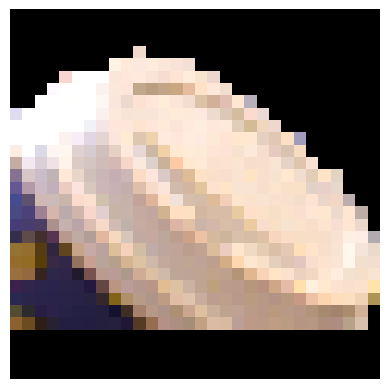

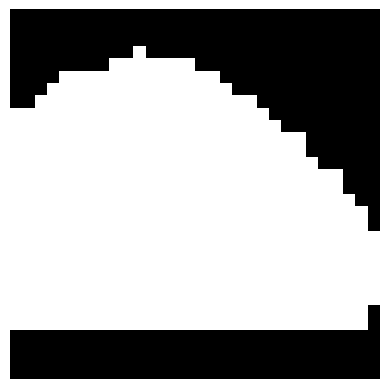

Clustering 139386 points in 256D to 2048 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.01 s
  Iteration 19 (0.49 s, search 0.38 s): objective=1.98273e+08 imbalance=1.096 nsplit=0       


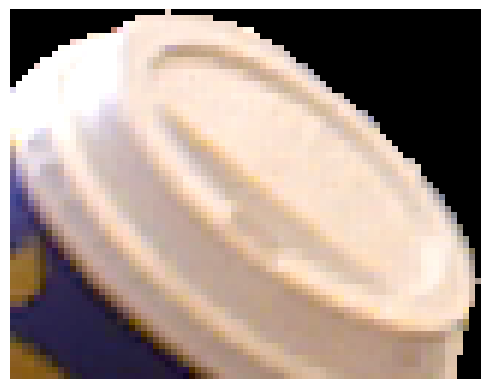

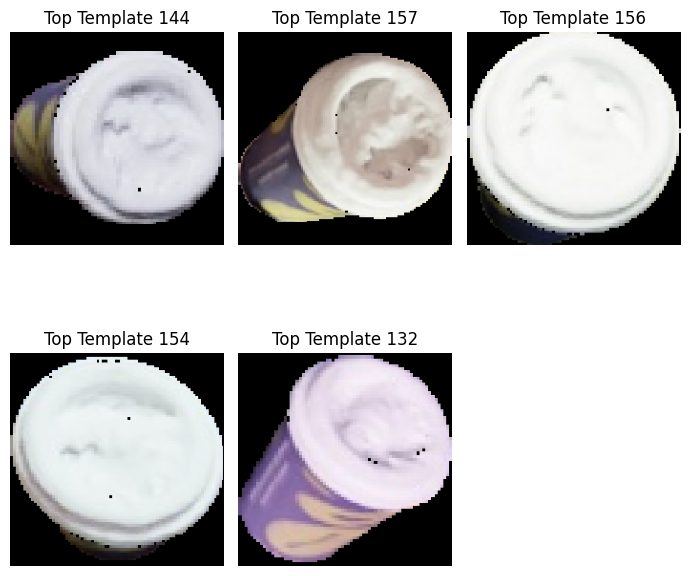

Top 5 scores: [0.322, 0.306, 0.26, 0.246, 0.22]
Average score: 0.271


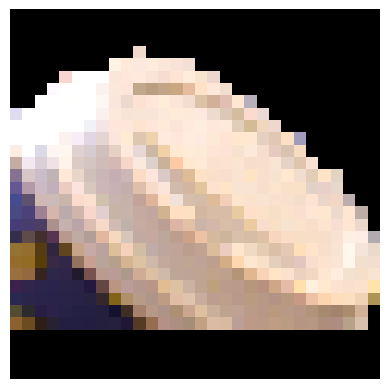

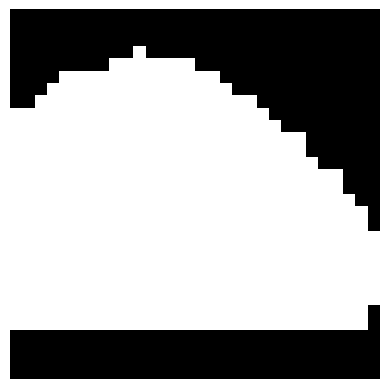

Clustering 187482 points in 256D to 2048 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.01 s
  Iteration 19 (0.67 s, search 0.52 s): objective=1.59603e+08 imbalance=1.087 nsplit=0       


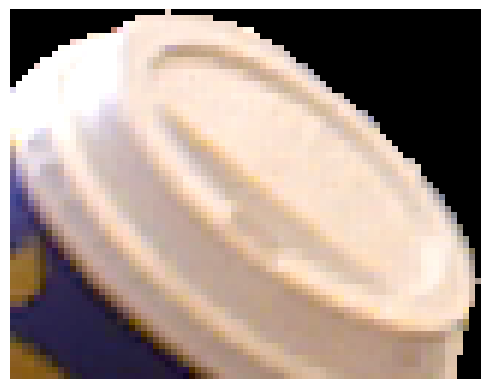

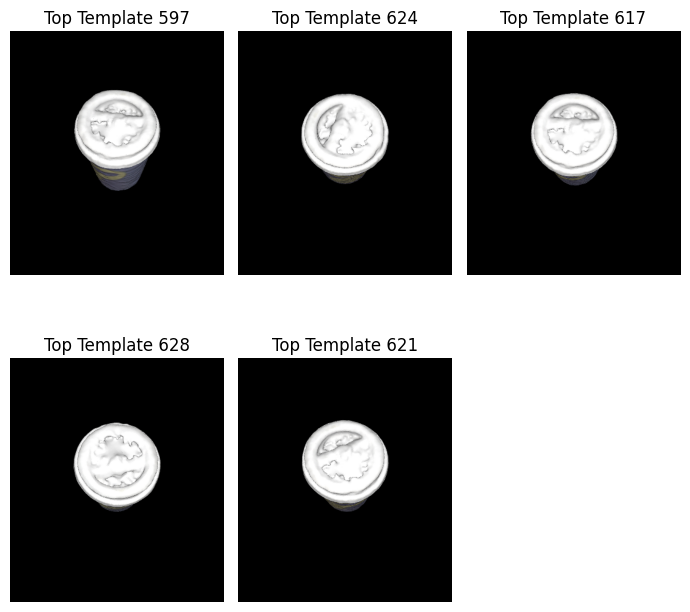

Top 5 scores: [0.229, 0.222, 0.215, 0.201, 0.197]
Average score: 0.213


0

In [164]:
bow_retrieval(occluded_crop, real_templates, real_valid_patch_features, real_num_valid_patches)
bow_retrieval(occluded_crop, syn_templates, syn_valid_patch_features, syn_num_valid_patches)
bow_retrieval(occluded_crop, pyrender_templates, pyrender_valid_patch_features, pyrender_num_valid_patches)

## 3.5 Small crop

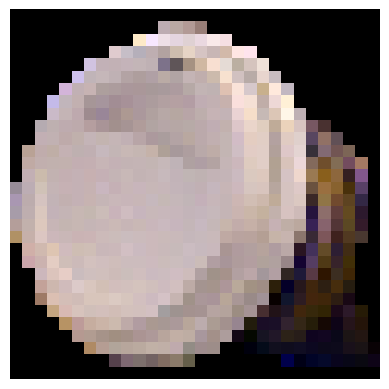

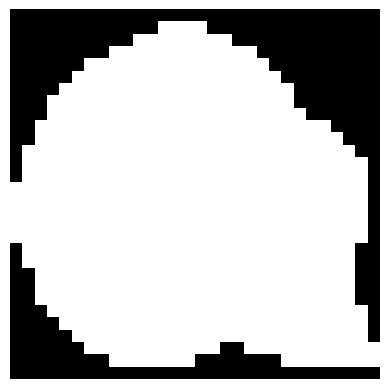

Clustering 132414 points in 256D to 2048 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.01 s
  Iteration 19 (0.46 s, search 0.36 s): objective=1.4824e+08 imbalance=1.145 nsplit=0        


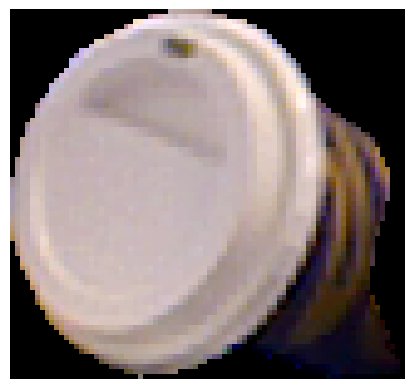

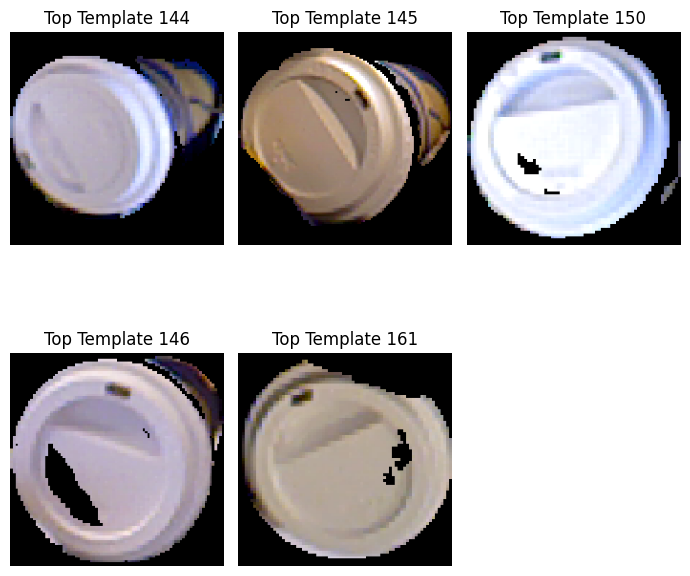

Top 5 scores: [0.542, 0.525, 0.391, 0.371, 0.355]
Average score: 0.437


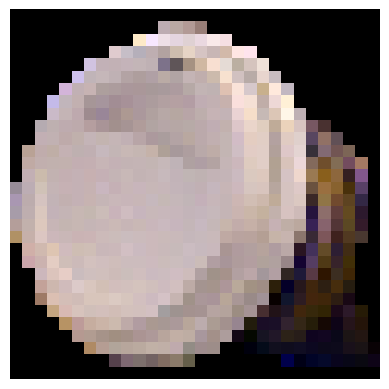

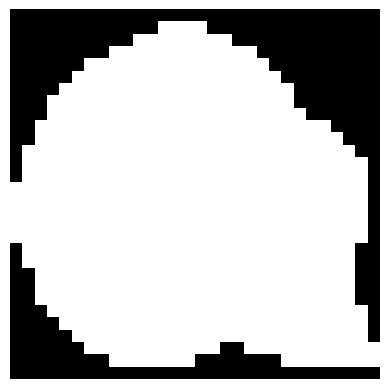

Clustering 139386 points in 256D to 2048 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.01 s
  Iteration 19 (0.49 s, search 0.38 s): objective=1.98324e+08 imbalance=1.096 nsplit=0       


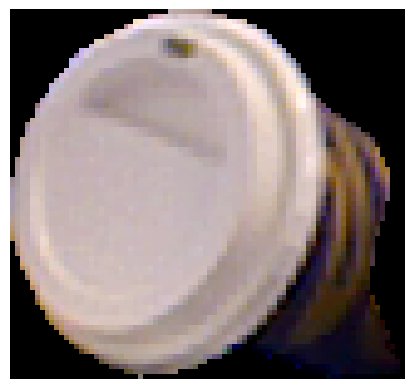

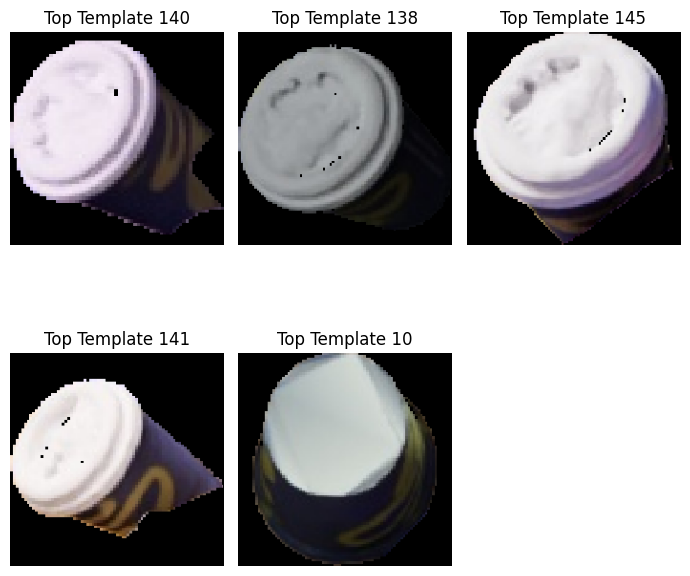

Top 5 scores: [0.541, 0.381, 0.31, 0.266, 0.225]
Average score: 0.345


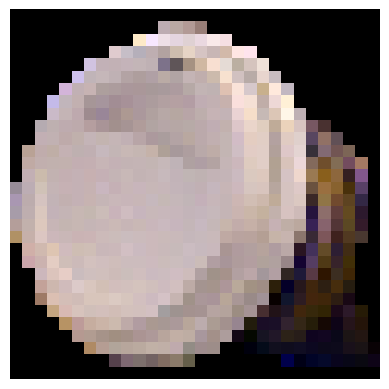

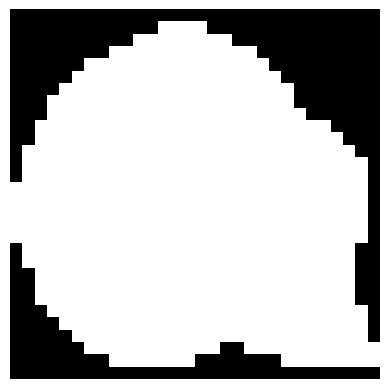

Clustering 187482 points in 256D to 2048 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.01 s
  Iteration 19 (0.65 s, search 0.51 s): objective=1.59613e+08 imbalance=1.086 nsplit=0       


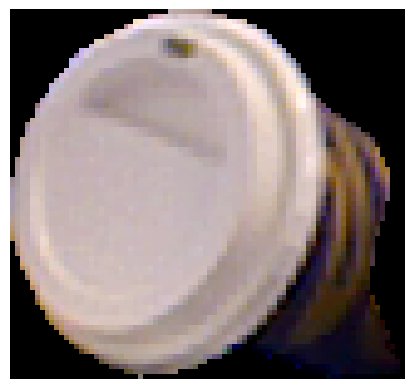

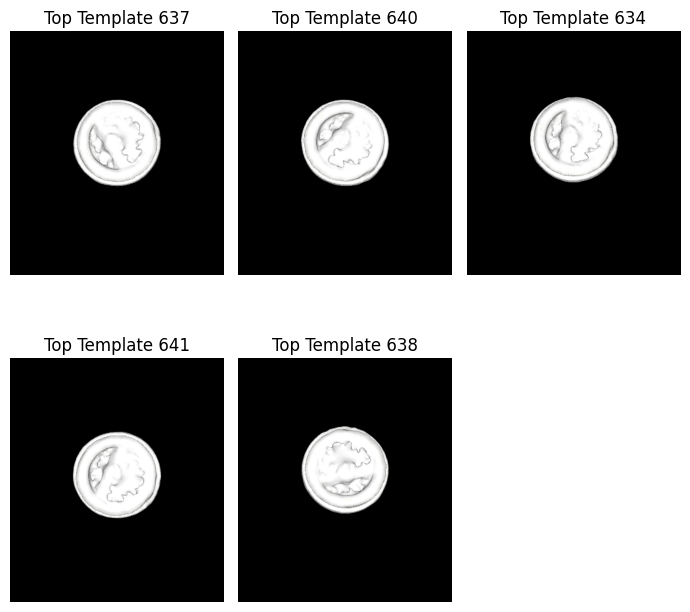

Top 5 scores: [0.281, 0.276, 0.272, 0.255, 0.251]
Average score: 0.267


0

In [165]:
# Small crop
small_crop_rgb = np.array(Image.open("cnos_analysis/crop_proposals/crop2.png").convert("RGB")) # (124, 157, 3)

bow_retrieval(small_crop_rgb, real_templates, real_valid_patch_features, real_num_valid_patches)
bow_retrieval(small_crop_rgb, syn_templates, syn_valid_patch_features, syn_num_valid_patches)
bow_retrieval(small_crop_rgb, pyrender_templates, pyrender_valid_patch_features, pyrender_num_valid_patches)

## 3.6 Background Crop

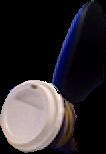

In [166]:
crop1["crop"]

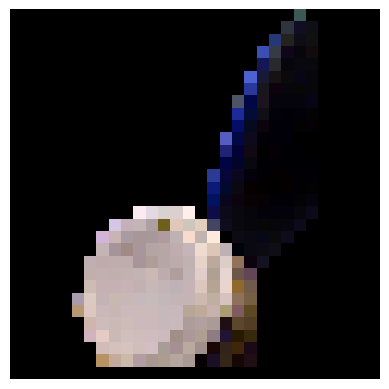

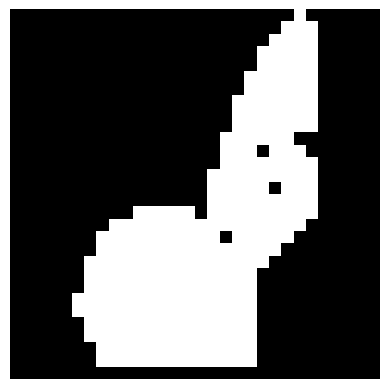

Clustering 132414 points in 256D to 2048 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.01 s
  Iteration 19 (0.46 s, search 0.36 s): objective=1.48293e+08 imbalance=1.146 nsplit=0       


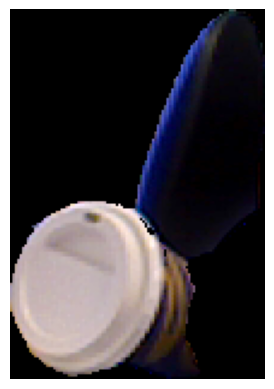

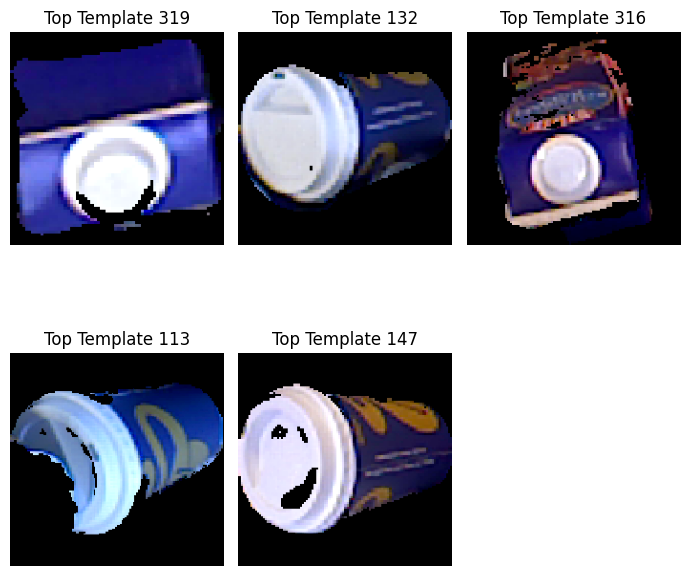

Top 5 scores: [0.255, 0.245, 0.225, 0.193, 0.192]
Average score: 0.222


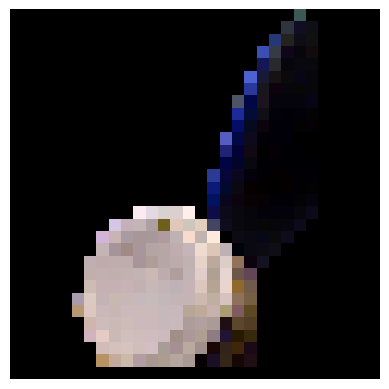

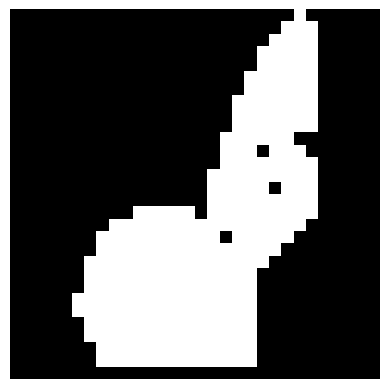

Clustering 139386 points in 256D to 2048 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.01 s
  Iteration 19 (0.49 s, search 0.38 s): objective=1.98282e+08 imbalance=1.096 nsplit=0       


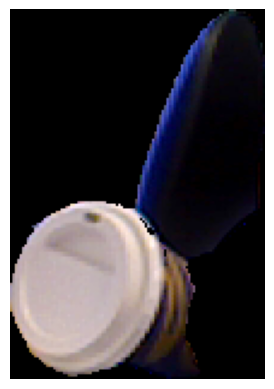

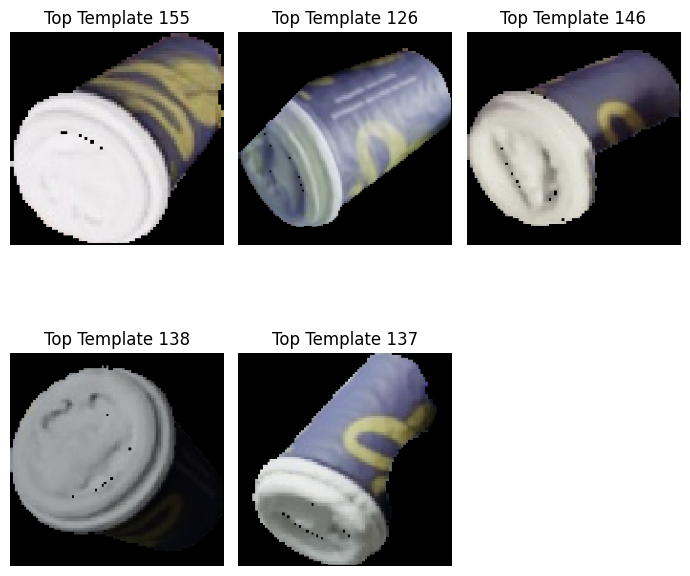

Top 5 scores: [0.31, 0.275, 0.269, 0.182, 0.174]
Average score: 0.242


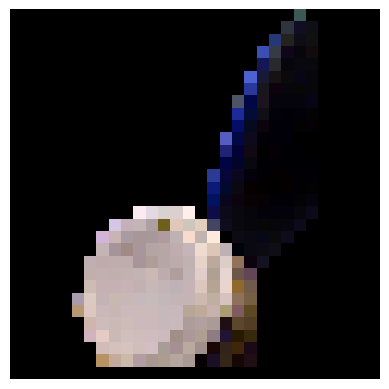

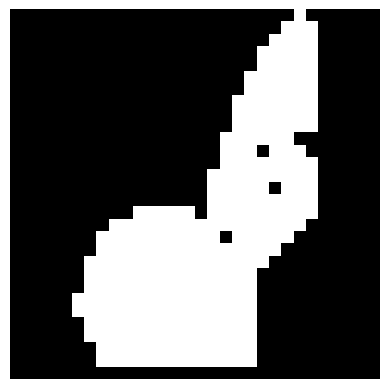

Clustering 187482 points in 256D to 2048 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.01 s
  Iteration 19 (0.68 s, search 0.52 s): objective=1.5964e+08 imbalance=1.086 nsplit=0        


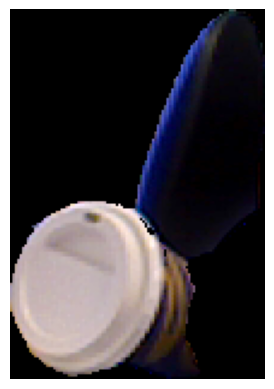

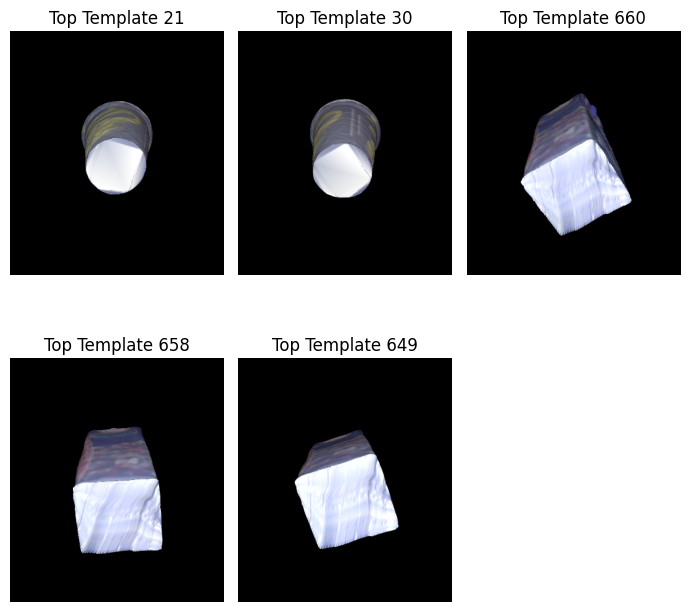

Top 5 scores: [0.154, 0.148, 0.148, 0.146, 0.14]
Average score: 0.147


0

In [167]:
background_crop = np.array(crop1["crop"]) # (124, 157, 3)
bow_retrieval(background_crop, real_templates, real_valid_patch_features, real_num_valid_patches)
bow_retrieval(background_crop, syn_templates, syn_valid_patch_features, syn_num_valid_patches)
bow_retrieval(background_crop, pyrender_templates, pyrender_valid_patch_features, pyrender_num_valid_patches)

# 4. Final Results

In [168]:
proposals = [np.array(masked_image) for i, masked_image in enumerate(masked_images)]
proposals_features = torch.cat([cnos_crop_feature_extraction(proposal, dinov2_vitl14, device) for proposal in proposals], dim = 0)

In [169]:
from src.model.custom_cnos import custom_detections, custom_visualize

scene_id = 1
image_id = 1
dataset_name = "icbin"
rgb_path = f'datasets/bop23_challenge/datasets/{dataset_name}/test/{scene_id:06d}/rgb/{image_id:06d}.png'

File output_cnos_analysis_5/test.json has been deleted.
File output_cnos_analysis_5/test.npz has been deleted.


Loading results ...: 100%|██████████| 1/1 [00:00<00:00, 32017.59it/s]


Saved predictions to output_cnos_analysis_5/test.json


100%|██████████| 9/9 [00:01<00:00,  5.36it/s]


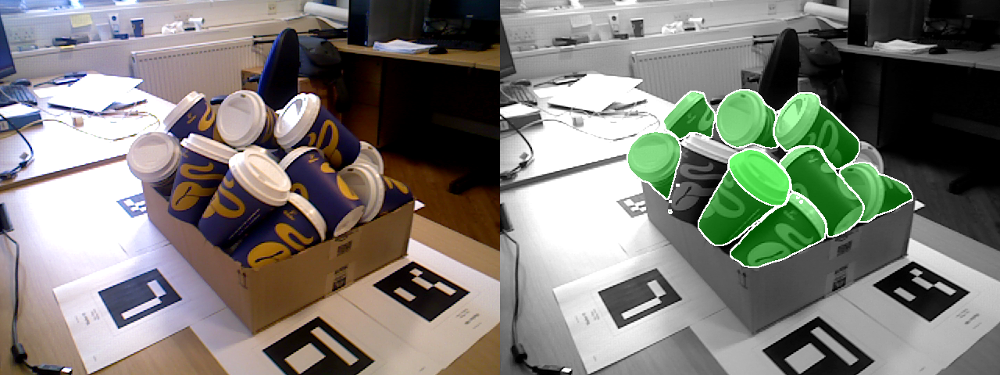

In [170]:
# Real Templates
file_path = f"output_cnos_analysis_5/{real_data_type}"
custom_detections(sam_detections, proposals_features, real_ref_features, file_path = file_path, scene_id=1, frame_id=1)
input_file = f"{file_path}.json"
final_result = custom_visualize(input_file, dataset_name, rgb_path)
final_result

File output_cnos_analysis_5/train_pbr.json has been deleted.
File output_cnos_analysis_5/train_pbr.npz has been deleted.


Loading results ...: 100%|██████████| 1/1 [00:00<00:00, 44150.57it/s]


Saved predictions to output_cnos_analysis_5/train_pbr.json


100%|██████████| 8/8 [00:01<00:00,  5.80it/s]


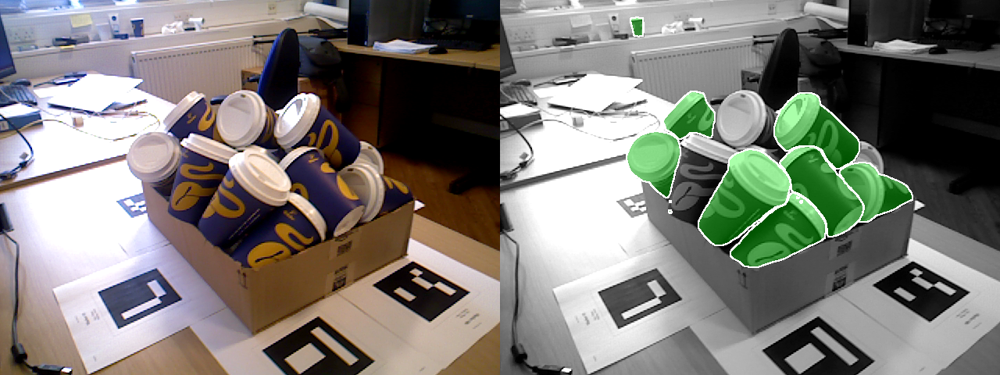

In [171]:
# Synthetic Templates
file_path = f"output_cnos_analysis_5/{syn_data_type}"
custom_detections(sam_detections, proposals_features, syn_ref_features, file_path = file_path, scene_id=1, frame_id=1)
input_file = f"{file_path}.json"
final_result = custom_visualize(input_file, dataset_name, rgb_path)
final_result

File output_cnos_analysis_5/pyrender.json has been deleted.
File output_cnos_analysis_5/pyrender.npz has been deleted.


Loading results ...: 100%|██████████| 1/1 [00:00<00:00, 39945.75it/s]


Saved predictions to output_cnos_analysis_5/pyrender.json


100%|██████████| 7/7 [00:01<00:00,  6.22it/s]


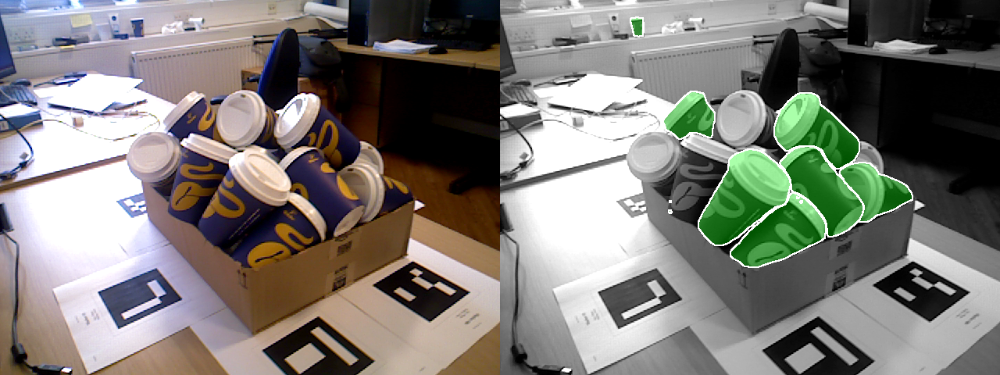

In [172]:
# Pyrender Templates
file_path = f"output_cnos_analysis_5/pyrender"
custom_detections(sam_detections, proposals_features, pyrender_ref_features, file_path = file_path, scene_id=1, frame_id=1)
input_file = f"{file_path}.json"
final_result = custom_visualize(input_file, dataset_name, rgb_path)
final_result

In [173]:
# from src.model.custom_cnos import modified_run_inference

# rgb_path = "cnos_analysis/crop_proposals/000001.png"
# template_dir = "foundpose_analysis/icbin/templates/test_images_templates/obj_000001_original"
# modified_run_inference(template_dir, rgb_path, sam_detections, real_ref_features, proposals_features)# , num_max_dets=15)

In [174]:
# syn_template_dir = "foundpose_analysis/icbin/templates/train_pbr_images_templates/obj_000001_original"
# modified_run_inference(syn_template_dir, rgb_path, sam_detections, syn_ref_features, proposals_features)

In [175]:
# pyrender_template_dir = "datasets/bop23_challenge/datasets/templates_pyrender/icbin/obj_000001"
# modified_run_inference(pyrender_template_dir, rgb_path, sam_detections, pyrender_ref_features, proposals_features)

# 5. Experiments with FoundPose

## 5.1 Apply PCA for Top 3
Change the features extract to the modified code- then run the code below

In [176]:
# from sklearn.decomposition import PCA
# concat_features = torch.cat(( normal_features.unsqueeze(0), real_ref_features[0]), dim=0) # [325, 900, 1024]
# # PCA
# pca = PCA(n_components=3, random_state=5)
# pca_patches_descriptors = [pca.fit_transform(np.array(concat_feature)).flatten() for concat_feature in concat_features]
# pca_normal_features = torch.tensor(pca_patches_descriptors[0])
# pca_real_ref_features = torch.tensor(pca_patches_descriptors[1:])
# calculate_similarity(crop_rgb, pca_normal_features.unsqueeze(0), pca_real_ref_features, real_templates)

: 